# Import Libraries

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.filters import roberts, sobel, scharr, prewitt

In [8]:
# The function takes as input the following parameter in the following sequence:
# 1. ImageVariable 
# 2. ColorScheme - RGB or Gray
# 3. Image tile name - Image will be saved with this fileName.png
# 4. showImage = 0/1 <- if we want to show image or not
# 5. saveImage = 0/1 <- Boolean variable to save the image or not 
# 6. saveImagePath <- The path where image should be saved... Default path is pwd
# 7. xtitle <- xlabel of the figure 
# 8. ytitle <- ylabel of the figure

def showImage(image,colorScale='RGB',imageTitle='',display = 1, saveImage=0,saveImagePath='./',xtitle='',ytitle=''):
    
    if colorScale == 'Gray':
        plt.imshow(image, cmap = plt.get_cmap('gray'));     
    else:
        cv_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(cv_rgb)

    plt.title(imageTitle)
    plt.xlabel(xtitle)
    plt.ylabel(ytitle)
    if(saveImage):
        plt.savefig(saveImagePath + '/' +  imageTitle+'.png')
    
    if(display == 0):
        return
    plt.show()
    
def showim(image):
    cv_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return(cv_rgb)  

def createTiles(x=1,y=1,hwidth=8,vwidth=4): 
    fig,plots = plt.subplots(x,y,figsize=(hwidth,vwidth));
    plots = plots.flatten()
    return(fig, plots)

# 1. Basic Image Operations

# 1.a. Image Read/Write

In [9]:
imgPath = '/home/adityav/UCSD/Spring17/COGS260_ImageRecognition/HW1/data/img/'
noiseImagePath = '/home/adityav/UCSD/Spring17/COGS260_ImageRecognition/HW1/data/snp/'
saveImagePath = '/home/adityav/UCSD/Spring17/COGS260_ImageRecognition/HW1/SaveImages/'

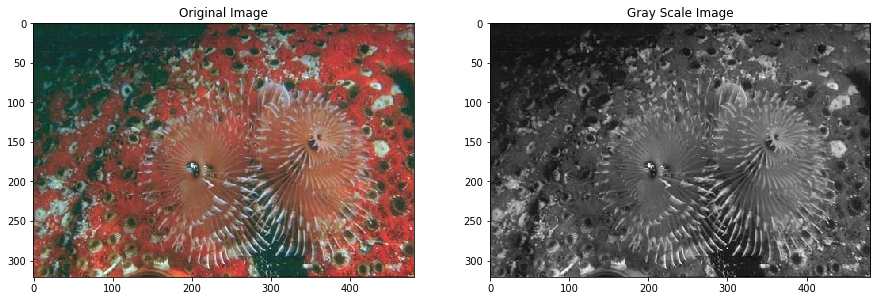

In [10]:
img = cv2.imread('data/img/12084.jpg')
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

fig, plots = createTiles(1,2,15,5)
plots[0].imshow(showim(img));    plots[0].set_title('Original Image')
plots[1].imshow(img_gray, cmap = plt.get_cmap('gray'));     plots[1].set_title('Gray Scale Image')
fig.savefig(saveImagePath+"1_a_ImageReadWrite.png",bbox_inches='tight')
fig

# 1.b. Image Smoothening

In [11]:
# load Image
imgList = !ls {imgPath}
imageList = []
imageList.append(cv2.imread(imgPath + imgList[0]))
imageList.append(cv2.imread(imgPath + imgList[1]))
imageList.append(cv2.imread(imgPath + imgList[2]))

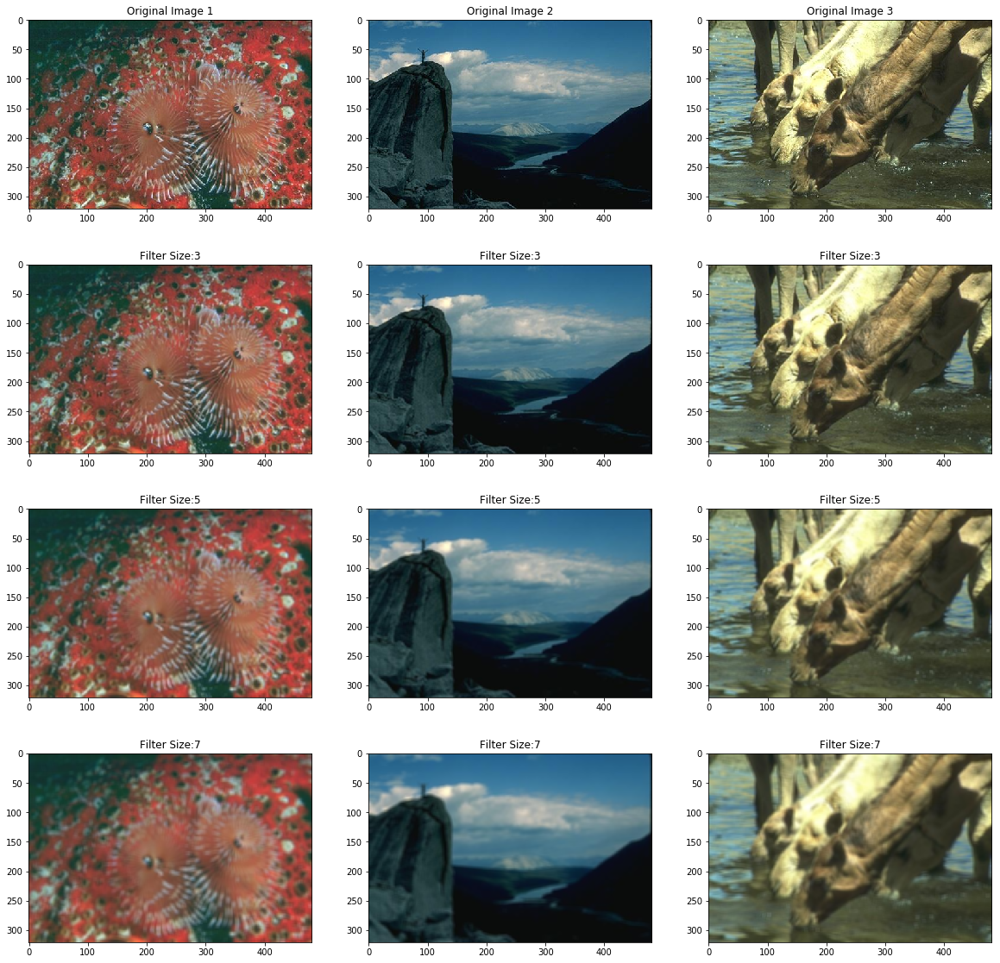

In [12]:
# Perform Average Smoothening
fig,plots = createTiles(4,3,20,20)
for i in range(3):
    plots[i].imshow(showim(imageList[i]))
    plots[i].set_title('Original Image '+ str(i+1))
count = 3
    
filterSize = [3,5,7]
for size in filterSize:
    for i in range(len(imageList)):
        image = imageList[i]
        avgImage = cv2.blur(image, (size,size))
        plots[count].imshow(showim(avgImage))
        plots[count].set_title('Filter Size:'+str(size))
        count = count + 1
fig.savefig(saveImagePath+'1_b_AverageFilter.png',bbox_inches='tight')
fig

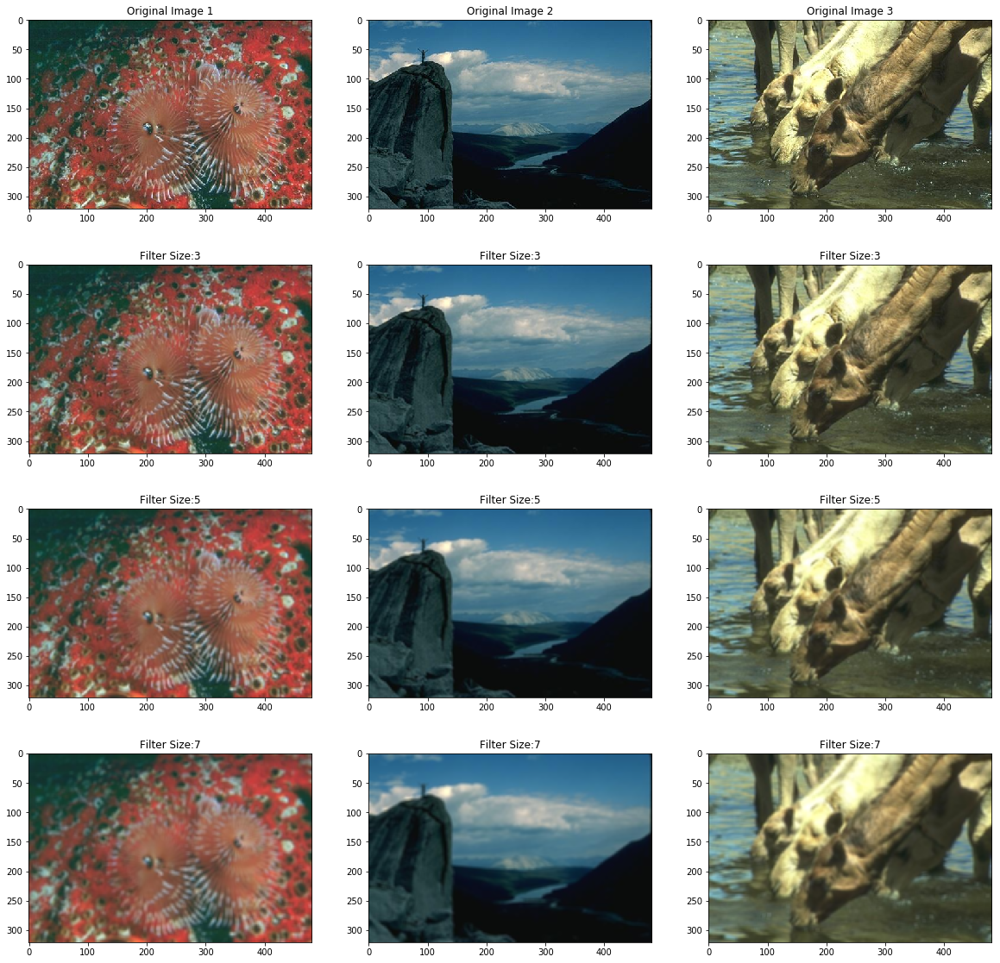

In [13]:
# Gaussian Blur
fig,plots = createTiles(4,3,20,20)
for i in range(3):
    plots[i].imshow(showim(imageList[i]))
    plots[i].set_title('Original Image '+ str(i+1))
count = 3
    
filterSize = [3,5,7]
for size in filterSize:
    for i in range(len(imageList)):
        image = imageList[i]
        avgImage = cv2.GaussianBlur(image, (size,size), size/2)
        plots[count].imshow(showim(avgImage))
        plots[count].set_title('Filter Size:'+str(size))
        count = count + 1

fig.savefig(saveImagePath+'1_b_GaussianSmooth.png',bbox_inches='tight')
fig

# 1.c.  Denoising

In [16]:
# load Image
imgList = !ls {noiseImagePath}
imageList = []
for img in imgList:
    imageList.append(cv2.imread(noiseImagePath + img))

fig, plots = createTiles(len(imageList),2,15,25)
# Remove White Noise
filterSize = 5
for i in range(len(imageList)):
    image = imageList[i]
    plots[i*2].imshow(showim(image));   plots[i*2].set_title('Image '+str(i+1))

    blurImage = cv2.medianBlur(image,filterSize)
    plots[i*2+1].imshow(showim(blurImage));    plots[i*2+1].set_title('Noise Filtered Image')
    
fig.savefig(saveImagePath+'1_c_DenoiseImage.png',bbox_inches='tight')

# Image Enhancement

# 2.a. Histogram 

In [17]:
def plotHist(image,fig):
    color = ('b','g','r')
    histr = np.zeros([3,256])
    for channel,col in enumerate(color):
        histr[channel,:] = cv2.calcHist([image],[channel],None,[256],[0,256]).T

    for i in range(3):
        fig.plot(histr[i,:],color[i])
        fig.set_xlim([0,256])

    fig.set_xlabel('Bin Value')
    fig.set_ylabel('Bin Count')
    fig.set_title('Higstogram Plot')

In [18]:
# load Image
imgList = !ls {imgPath}
imageList = []
imageList.append(cv2.imread(imgPath + imgList[0]))
imageList.append(cv2.imread(imgPath + imgList[1]))
imageList.append(cv2.imread(imgPath + imgList[2]))

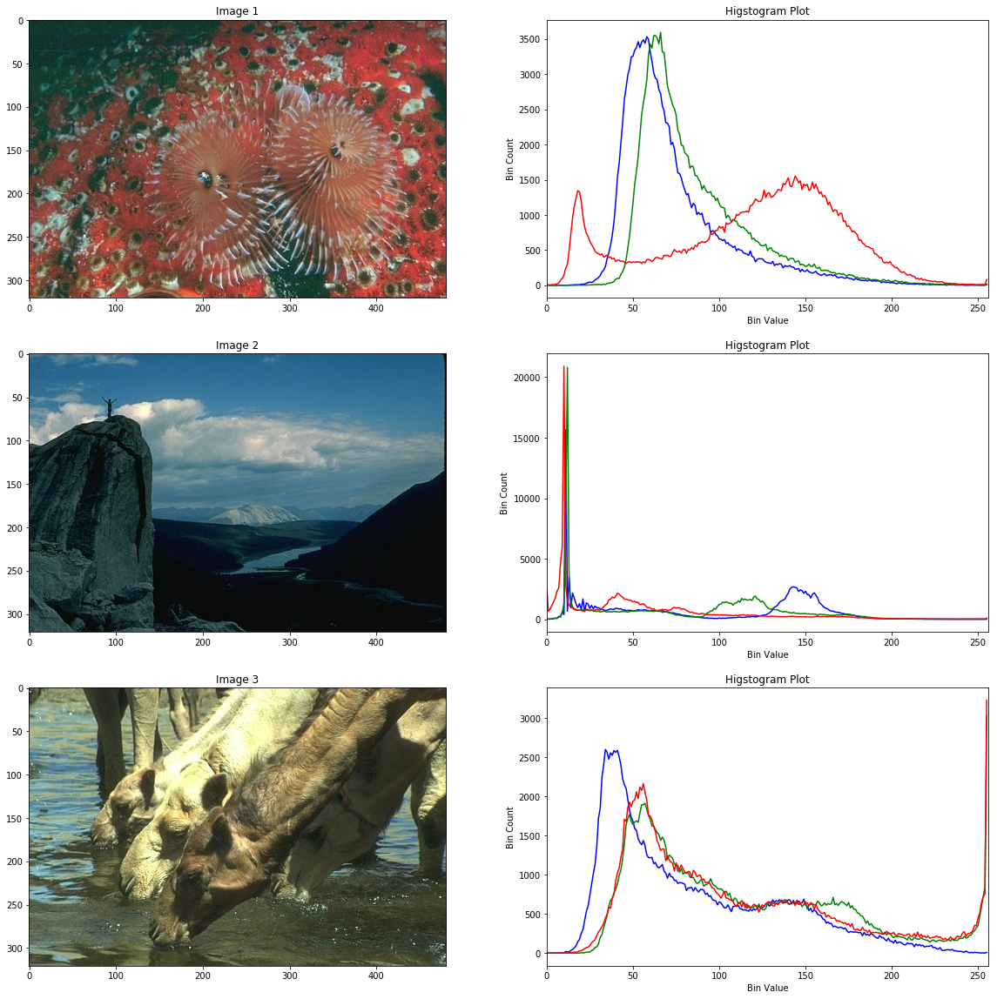

In [19]:

# Plot Histogram
fig,plots = createTiles(3,2,20,20)
color = ('b','g','r')
for i in range(len(imageList)):
    img = imageList[i]
    plots[2*i].imshow(showim(img));    plots[2*i].set_title('Image '+str(i+1))
    
    plotHist(img,plots[2*i+1])
    
fig.savefig(saveImagePath+'2_a_HistogramPlot.png',bbox_inches='tight')
fig

# 2.(b) Global Histogram Equalization

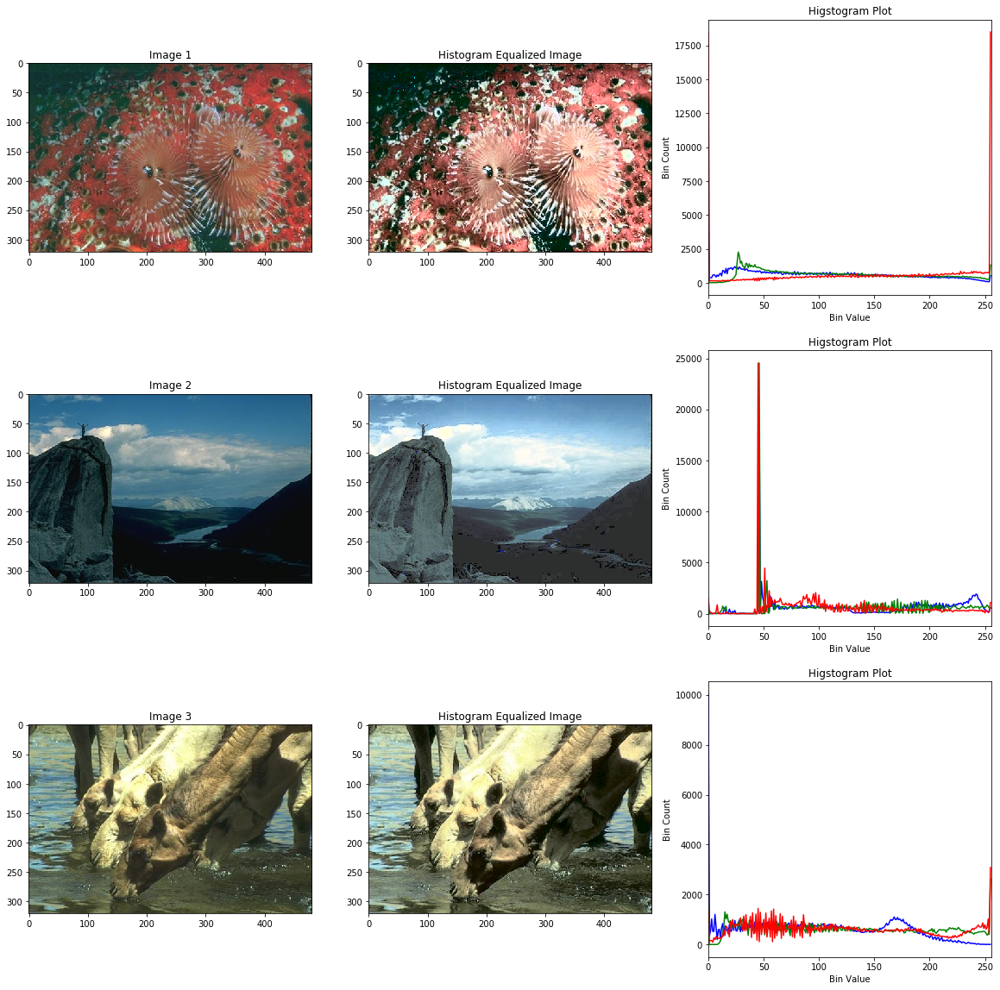

In [20]:
# ImageList was prepared in the last cell block
# Perform Average Smoothening
fig,plots = createTiles(3,3,20,20)
color = ('b','g','r')

for i in range(len(imageList)):

    img = imageList[i]
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)

    # equalize the histogram of the Y channel
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    # convert the YUV image back to RGB format
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_LUV2BGR)

    plots[3*i].imshow(showim(imageList[i]));   plots[3*i].set_title('Image ' + str(i+1))
    plots[3*i+1].imshow(showim(img_eq));   plots[3*i+1].set_title('Histogram Equalized Image')
    plotHist(img_eq,plots[3*i+2])

fig.savefig(saveImagePath+'2_b_HistogramEqualizedImage.png',bbox_inches='tight')
fig 

# 2.(c) Adaptive Histogram Equalization (CLAHE)

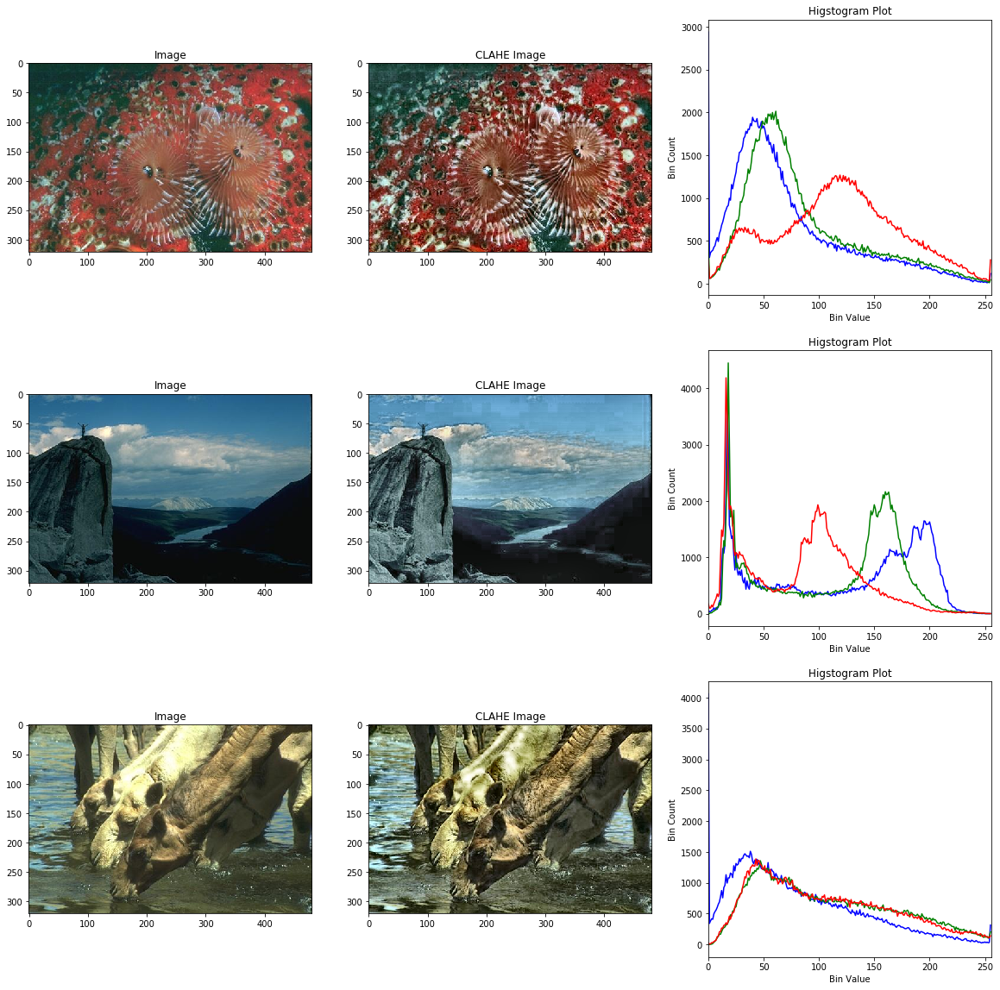

In [21]:
# ImageList was prepared in 2 block above
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
fig,plots = createTiles(len(imageList),3,20,20)
color = ('b','g','r')

for i in range(len(imageList)):
    img = imageList[i]
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

    # equalize the histogram of the Y channel
    img_yuv[:,:,0] = clahe.apply(img[:,:,0])
    
    # convert the YUV image back to RGB format
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

    plots[3*i].imshow(showim(img));   plots[3*i].set_title('Image')
    plots[3*i+1].imshow(showim(img_output));   plots[3*i+1].set_title('CLAHE Image')
    plotHist(img_output,plots[3*i+2])
    
fig.savefig(saveImagePath+'2_c_CLAHE.png',bbox_inches='tight')
fig


# 3 Edge Detection

In [22]:
groundTruth = '/home/adityav/UCSD/Spring17/COGS260_ImageRecognition/HW1/data/ground_truth/'

In [23]:
# Script to evaluate the accuracy of Edge Detector Algorithm
def evaluate(f_img,f_gt):    
    accuracy=0.0
    img = f_img
    gt = f_gt

    (m,n)=np.shape(img)
    
    for i in range(m):
        for j in range(n):
            if(gt[i,j]>=100):
                gt[i,j]=1
            else:
                gt[i,j]=0
            if(img[i,j]>=100):
                img[i,j]=1
            else:
                img[i,j]=0
    f=3 #Filter size
    for i in range(m-f):
        for j in range(n-f):
            im=img[i:i+f,j:j+f]
            gtr=gt[i:i+f,j:j+f]
            if((np.sum(im)==0 and np.sum(gtr)!=0) or (np.sum(gtr)==0 and np.sum(im)!=0)):
                accuracy-=1
            else:
                accuracy+=1
                
    if accuracy<0:
        accuracy=0        
    return accuracy/(m*n) 

# Canny

Image: 12084.jpg 	 Accuracy: 0.32 
Image: 14037.jpg 	 Accuracy: 0.72 
Image: 16077.jpg 	 Accuracy: 0.39 
Image: 19021.jpg 	 Accuracy: 0.35 
Image: 21077.jpg 	 Accuracy: 0.61 
Image: 24077.jpg 	 Accuracy: 0.37 
Image: 3096.jpg 	 Accuracy: 0.85 
Image: 33039.jpg 	 Accuracy: 0.00 
Image: 37073.jpg 	 Accuracy: 0.74 
Image: 8023.jpg 	 Accuracy: 0.71 


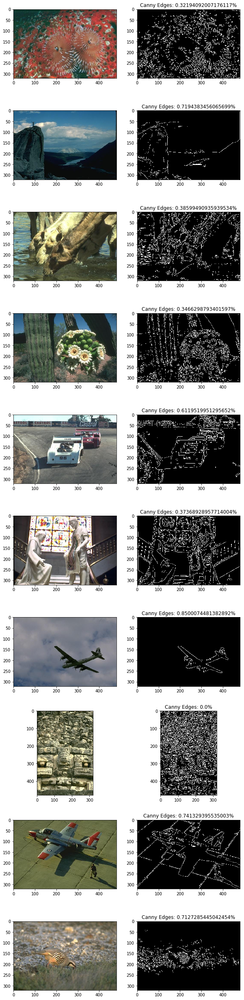

In [24]:
# Canny Edge Detection 
def auto_canny(image, sigma=0.25):
	# compute the median of the single channel pixel intensities
	v = np.median(image)
 
	# apply automatic Canny edge detection using the computed median
	lower = int(max(0, (1.0 - sigma) * v))
	upper = int(min(255, (1.0 + sigma) * v))
	edged = cv2.Canny(image, 150, 220)
 
	# return the edged image
	return edged

# load Image
imgList = !ls {imgPath}
imageList = []
for img in imgList:
    imageList.append(cv2.imread(imgPath+img))
fig,plots = createTiles(len(imageList),2,10,45)

for i in range(len(imageList)):
    image = cv2.cvtColor(imageList[i],cv2.COLOR_BGR2GRAY)
    plots[i*2].imshow(showim(imageList[i]));         plots[i*2+1].set_title('Image '+str(i))
    
    canny_edge = auto_canny(image);
    gt = cv2.cvtColor(cv2.imread(groundTruth + imgList[i].split('.')[0]+'.bmp'),cv2.COLOR_BGR2GRAY)
    accuracy = evaluate(canny_edge,gt)
    
    plots[i*2+1].imshow(canny_edge, cmap = plt.get_cmap('gray'));
    plots[i*2+1].set_title('Canny Edges: '+str(accuracy)+"%")
    
    print('Image: '+imgList[i]+' \t Accuracy: %.2f ' %accuracy  )
    
fig.savefig(saveImagePath+'3_Canny.png',bbox_inches='tight')
fig

# Sobel Filter

In [25]:
#cv2.imshow('image',image)
sobel_edge = sobel(image)
cv2.imshow('image',sobel_edge)
cv2.waitKey(0)

255

Image: 12084.jpg 	 Accuracy: 0.68 
Image: 14037.jpg 	 Accuracy: 0.72 
Image: 16077.jpg 	 Accuracy: 0.79 
Image: 19021.jpg 	 Accuracy: 0.80 
Image: 21077.jpg 	 Accuracy: 0.70 
Image: 24077.jpg 	 Accuracy: 0.52 
Image: 3096.jpg 	 Accuracy: 0.81 
Image: 33039.jpg 	 Accuracy: 0.79 
Image: 37073.jpg 	 Accuracy: 0.60 
Image: 8023.jpg 	 Accuracy: 0.86 


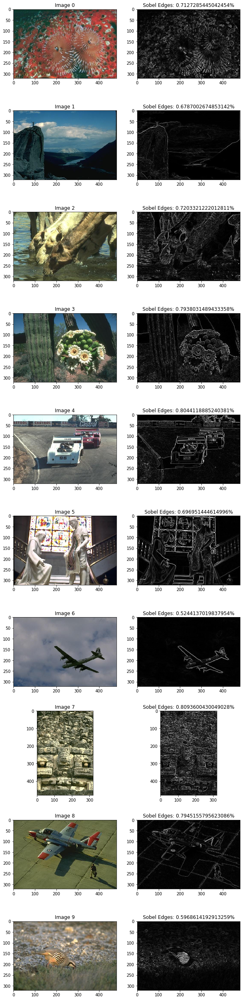

In [26]:
# Sobel Edge Detection 
# load Image
imgList = !ls {imgPath}
imageList = []
for img in imgList:
    imageList.append(cv2.imread(imgPath+img))
fig,plots = createTiles(len(imageList),2,10,45)

for i in range(len(imageList)):
    image = cv2.cvtColor(imageList[i],cv2.COLOR_BGR2GRAY)
    plots[i*2].imshow(showim(imageList[i]));         plots[i*2].set_title('Image '+str(i))

    sobel_edge = sobel(image);
    plots[i*2+1].imshow(sobel_edge, cmap = plt.get_cmap('gray'));
    plots[i*2+1].set_title('Sobel Edges: '+str(accuracy)+"%")

    gt = cv2.cvtColor(cv2.imread(groundTruth + imgList[i].split('.')[0]+'.bmp'),cv2.COLOR_BGR2GRAY)
    accuracy = evaluate(sobel_edge,gt)
    
#     plots[i*2+1].imshow(sobel_edge, cmap = plt.get_cmap('gray'));
    
    print('Image: '+imgList[i]+' \t Accuracy: %.2f ' %accuracy  )
    
fig.savefig(saveImagePath+'3_Sobel.png',bbox_inches='tight')
fig